In [1]:
import numpy as np
import dxchange
import holotomo
import matplotlib.pyplot as plt
import cv2
import xraylib
import random
import scipy.ndimage as ndimage
import tifffile
import h5py 
import cupy as cp
import holotomo
PLANCK_CONSTANT = 4.135667696e-18  # [keV*s]
SPEED_OF_LIGHT = 299792458  # [m/s]

%matplotlib inline

cp.cuda.Device(0).use()

<CUDA Device 0>

5.6291337
5.629136


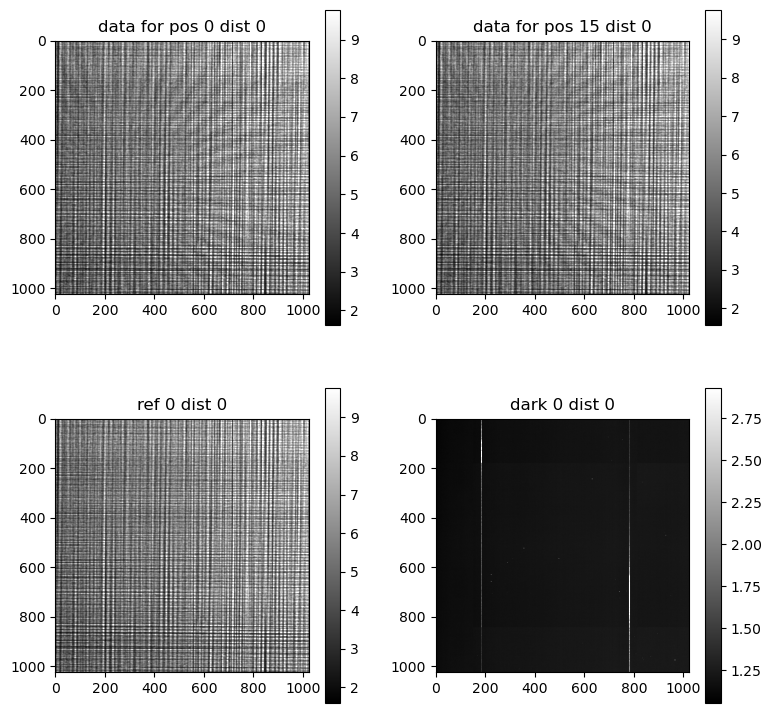

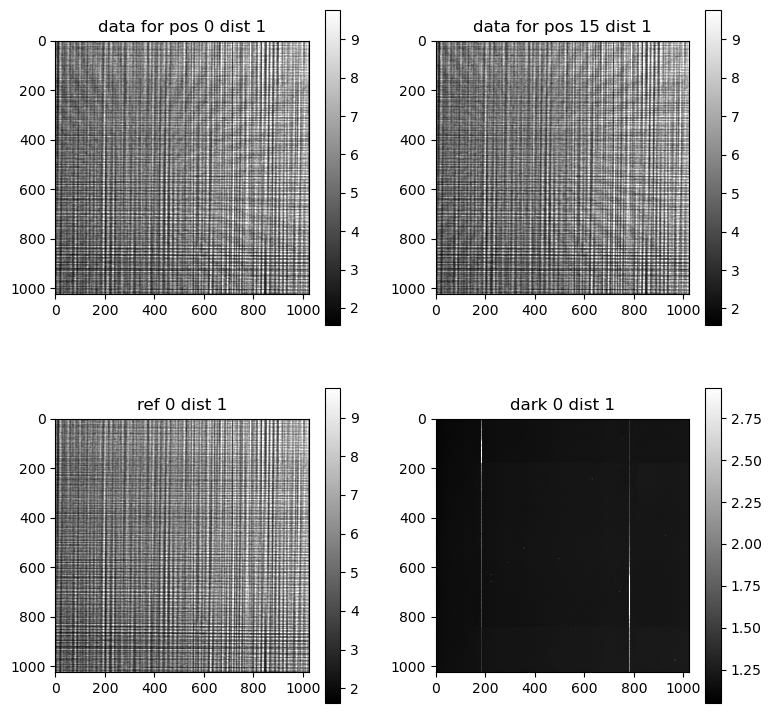

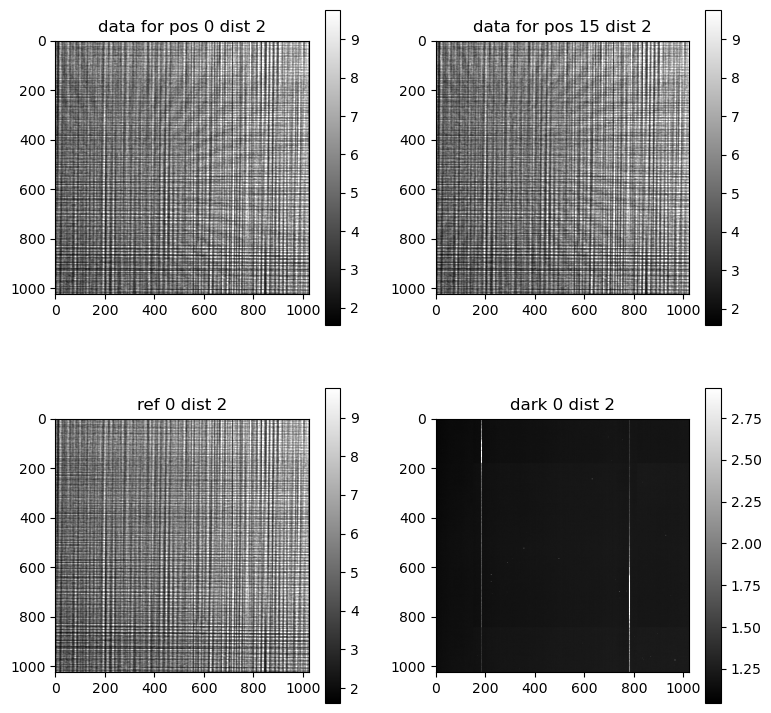

In [2]:
n = 1024
npos = 16
nref = 20
ndark = 20
ndist = 3
data0 = np.zeros([npos,ndist,n,n],dtype='float32')
ref0 = np.zeros([nref,ndist,n,n],dtype='float32')
dark0 = np.zeros([ndark,ndist,n,n],dtype='float32')
for k in range(ndist):
    with h5py.File(f'/data/viktor/SiemensLH_33keV_010nm_holoNfpScan_0{k+1}/SiemensLH_33keV_010nm_holoNfpScan_0{k+1}0000.h5','r') as fid:
        data0[:,k] = fid['/entry_0000/measurement/data'][:npos,1024-n//2:1024+n//2,1024-n//2:1024+n//2].copy().astype('float32')/n
    with h5py.File(f'/data/viktor/SiemensLH_33keV_010nm_holoNfpScan_0{k+1}/ref_0000.h5','r') as fid:
        ref0[:,k]=fid['/entry_0000/measurement/data'][:nref,1024-n//2:1024+n//2,1024-n//2:1024+n//2].copy().astype('float32')/n
    with h5py.File(f'/data/viktor/SiemensLH_33keV_010nm_holoNfpScan_0{k+1}/dark_0000.h5','r') as fid:
        dark0[:,k]=fid['/entry_0000/measurement/data'][:ndark,1024-n//2:1024+n//2,1024-n//2:1024+n//2].copy().astype('float32')/n
    fig, axs = plt.subplots(2, 2, figsize=(9, 9))
    im=axs[0,0].imshow(data0[0,k],cmap='gray',vmax=10000/n)
    axs[0,0].set_title(f'data for pos 0 dist {k}')
    fig.colorbar(im)
    im=axs[0,1].imshow(data0[-1,k],cmap='gray',vmax=10000/n)
    axs[0,1].set_title(f'data for pos {npos-1} dist {k}')
    fig.colorbar(im)
    im=axs[1,0].imshow(ref0[0,k],cmap='gray',vmax=10000/n)
    axs[1,0].set_title(f'ref 0 dist {k}')
    fig.colorbar(im)
    im=axs[1,1].imshow(dark0[-1,k],cmap='gray',vmax=3000/n)
    axs[1,1].set_title(f'dark 0 dist {k}')
    fig.colorbar(im)
    

for k in range(1,ndist):   
    ref0[:,k]*=(np.mean(ref0[:,0])/np.mean(ref0[:,k]))
    data0[:,k]*=(np.mean(data0[:,0])/np.mean(data0[:,k]))

print(np.mean(ref0[:,0]))
print(np.mean(ref0[:,-1]))

# Dark-flat field correction

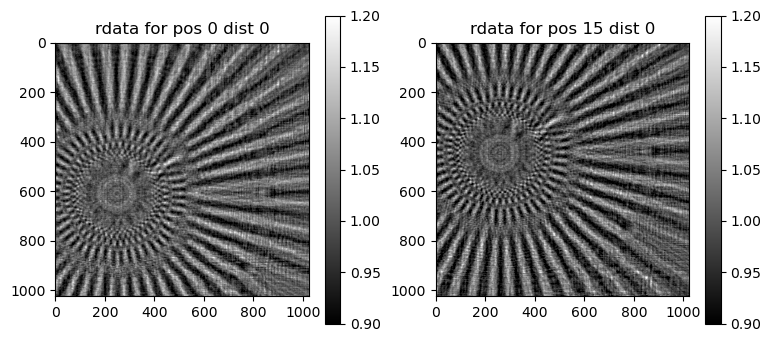

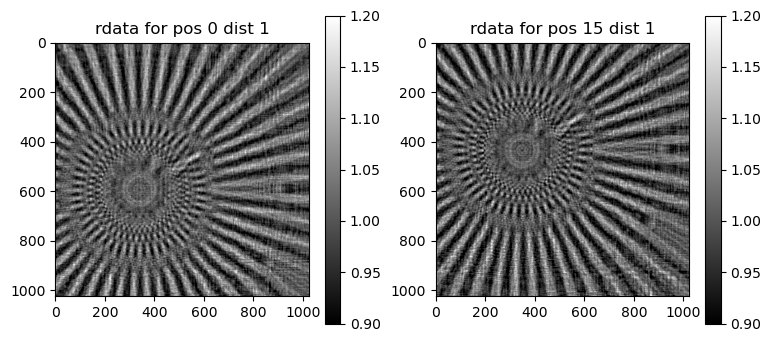

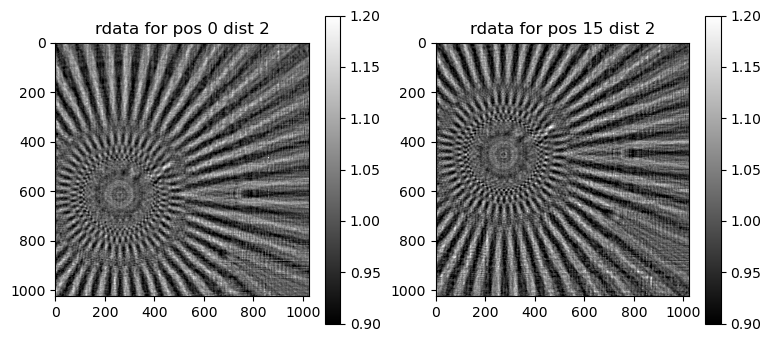

In [3]:
rdata = (data0-np.median(dark0,axis=0))
rref = (np.median(ref0,axis=0)-np.median(dark0,axis=0))
rref[rref<0] = 0
rdata[rdata<0]=0
rdata/=(rref+1e-9)

for k in range(ndist):
    fig, axs = plt.subplots(1, 2, figsize=(9, 4))
    im=axs[0].imshow(rdata[0,k],cmap='gray',vmin = 0.9,vmax=1.2 )
    axs[0].set_title(f'rdata for pos 0 dist {k}')
    fig.colorbar(im)
    im=axs[1].imshow(rdata[-1,k],cmap='gray',vmin = 0.9,vmax=1.2 )
    axs[1].set_title(f'rdata for pos {npos-1} dist {k}')
    fig.colorbar(im)

# Init data sizes and parametes of the PXM of ID16A

In [4]:
voxelsize = 10e-9 # [m] object voxel size 
energy = 33.35  # [keV] x-ray energy    
wavelength = PLANCK_CONSTANT * SPEED_OF_LIGHT / energy # [m]
focusToDetectorDistance = 1.28 # [m]


sx0 = 3.7e-4#3.9265e-4#3.7e-4# # [m] motor offset from the focal spot
z1 = np.array([4.584e-3,4.765e-3,5.488e-3,6.9895e-3])[:ndist]-sx0 # positions of the sample (1 position is enough when using several codes)
z2 = focusToDetectorDistance-z1 # propagation distance between the code and detector
magnifications = (z1+z2)/z1 # magnification when propagating from the sample to the code
norm_magnifications = magnifications/magnifications[0] # normalized magnifications
distances = (z1*z2)/(z1+z2) # propagation distances after switching from the point source wave to plane wave,
distances = distances*norm_magnifications**2 # scaled propagation distances due to magnified probes
voxelsize/norm_magnifications

array([1.00000000e-08, 1.04295206e-08, 1.21452302e-08])

# Read motor shifts

In [5]:
shifts_motor=np.zeros([npos,ndist,2],dtype='float32')
for k in range(ndist):
    with h5py.File(f'/data/viktor/SiemensLH_33keV_010nm_holoNfpScan_0{k+1}/SiemensLH_33keV_010nm_holoNfpScan_0{k+1}0000.h5','r') as fid:
        shifts_motor[:,k,0] = -1e-6/(voxelsize/norm_magnifications[k])*(np.array(fid['/entry_0000/instrument/PCIe/header/spz'][()].split()[:npos]).astype('float32'))
        shifts_motor[:,k,1] = 1e-6/(voxelsize/norm_magnifications[k])*(np.array(fid['/entry_0000/instrument/PCIe/header/spy'][()].split()[:npos]).astype('float32'))
print(shifts_motor)
shifts_motor = np.round(shifts_motor)
print('use motor shifts')


[[[ 85.000404 -83.0004  ]
  [ 82.00041  -82.00041 ]
  [ 85.00044  -86.00084 ]]

 [[ 78.000404 -84.000404]
  [ 78.00042  -84.00041 ]
  [ 77.00052  -82.0005  ]]

 [[ 76.0004   -79.000404]
  [ 79.00037  -79.00037 ]
  [ 79.00048  -77.00052 ]]

 [[ 80.0004   -74.0004  ]
  [ 83.00046  -76.00043 ]
  [ 83.00049  -76.00046 ]]

 [[ 80.0004    76.0004  ]
  [ 79.00037   73.00038 ]
  [ 77.00052   76.00046 ]]

 [[ 74.0004    76.0004  ]
  [ 73.00038   76.00043 ]
  [ 76.00046   75.00047 ]]

 [[ 78.000404  82.0004  ]
  [ 79.00037   84.00041 ]
  [ 77.00052   85.00044 ]]

 [[ 71.0004    80.0004  ]
  [ 67.0004    83.00046 ]
  [ 67.000465  82.0005  ]]

 [[-66.0003    91.000496]
  [-67.0004    93.00044 ]
  [-68.00044   93.000305]]

 [[-74.0004    80.0004  ]
  [-77.000374  76.00043 ]
  [-75.00047   80.00054 ]]

 [[-74.0004    73.000404]
  [-72.000336  70.00034 ]
  [-72.00045   73.00043 ]]

 [[-65.000305  67.0003  ]
  [-65.000305  68.00034 ]
  [-64.000435  68.00044 ]]

 [[-77.0004   -67.0003  ]
  [-73.00038  

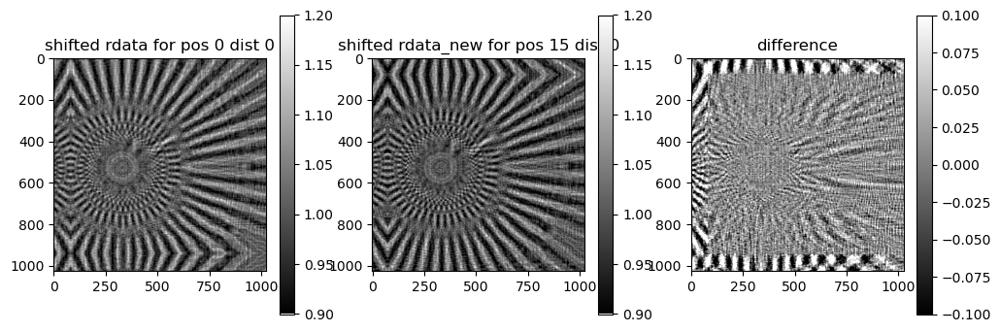

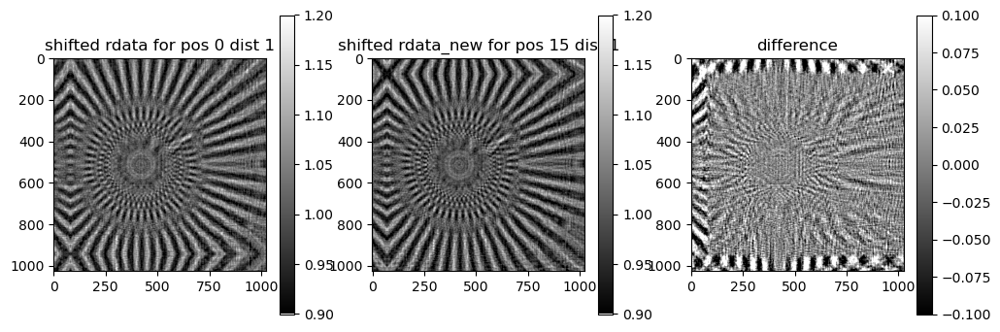

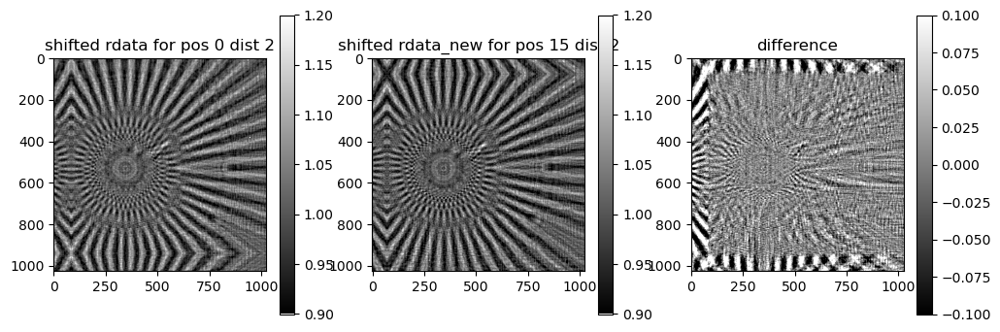

In [6]:
def apply_shift(psi, p):
    """Apply shift for all projections."""
    psi = cp.array(psi)
    p = cp.array(p)
    tmp = cp.pad(psi,((0,0),(n//2,n//2),(n//2,n//2)), 'symmetric')
    [x, y] = cp.meshgrid(cp.fft.rfftfreq(2*n),
                         cp.fft.fftfreq(2*n))
    shift = cp.exp(-2*cp.pi*1j *
                   (x*p[:, 1, None, None]+y*p[:, 0, None, None]))
    res0 = cp.fft.irfft2(shift*cp.fft.rfft2(tmp))
    res = res0[:, n//2:3*n//2, n//2:3*n//2].get()
    return res
rdata_new = rdata.copy()    
for k in range(ndist):
    for j in range(npos):
        #print(f'shift for pos {k} dist {j} is {shifts[k,j]}')
        rdata_new[j,k:k+1] = apply_shift(rdata[j,k:k+1],-shifts_motor[j,k:k+1])

for k in range(ndist):
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    im=axs[0].imshow(rdata_new[0,k],cmap='gray',vmin = 0.9,vmax=1.2 )
    axs[0].set_title(f'shifted rdata for pos 0 dist {k}')
    fig.colorbar(im)
    im=axs[1].imshow(rdata_new[-1,k],cmap='gray',vmin = 0.9,vmax=1.2 )
    axs[1].set_title(f'shifted rdata_new for pos {npos-1} dist {k}')
    fig.colorbar(im)        
    im=axs[2].imshow(rdata_new[0,k]-rdata_new[-1,k],cmap='gray',vmin =-0.1,vmax=0.1 )
    axs[2].set_title(f'difference')
    fig.colorbar(im)        

# Scale everything to 1 magnification

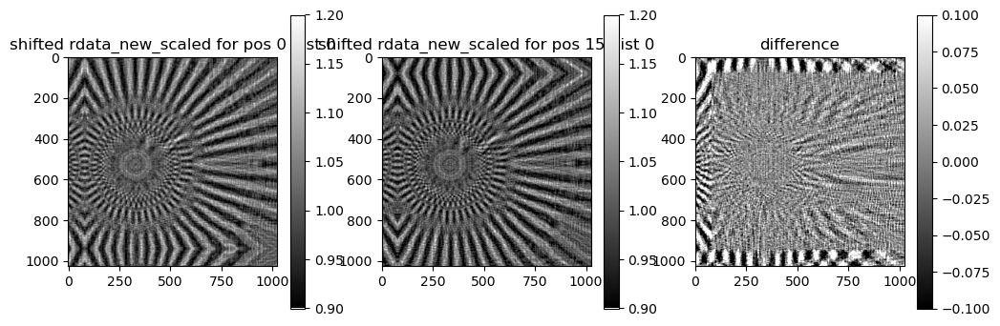

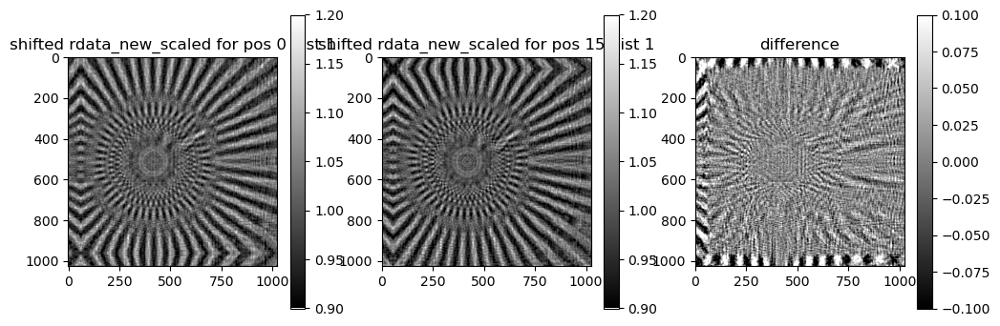

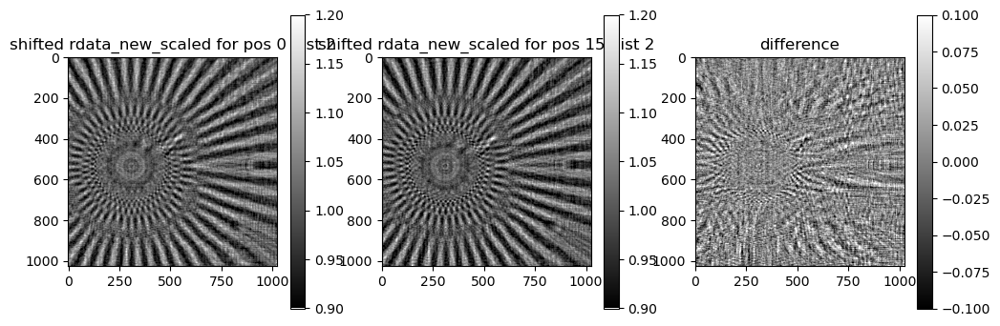

In [7]:
rdata_new_scaled = rdata_new.copy()
for j in range(npos):
    for k in range(ndist):    
        a = ndimage.zoom(rdata_new[j,k],1/norm_magnifications[k])
        rdata_new_scaled[j,k] = a[a.shape[0]//2-n//2:a.shape[0]//2+n//2,a.shape[1]//2-n//2:a.shape[1]//2+n//2]

for k in range(ndist):
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    im=axs[0].imshow(rdata_new_scaled[0,k],cmap='gray',vmin = 0.9,vmax=1.2 )
    axs[0].set_title(f'shifted rdata_new_scaled for pos 0 dist {k}')
    fig.colorbar(im)
    im=axs[1].imshow(rdata_new_scaled[-1,k],cmap='gray',vmin = 0.9,vmax=1.2 )
    axs[1].set_title(f'shifted rdata_new_scaled for pos {npos-1} dist {k}')
    fig.colorbar(im)        
    im=axs[2].imshow(rdata_new_scaled[0,k]-rdata_new_scaled[-1,k],cmap='gray',vmin =-0.1,vmax=0.1 )
    axs[2].set_title(f'difference')
    fig.colorbar(im)        

# Align data between different magnifications

In [8]:
def _upsampled_dft(data, ups,
                   upsample_factor=1, axis_offsets=None):

    im2pi = 1j * 2 * np.pi
    tdata = data.copy()
    kernel = (np.tile(np.arange(ups), (data.shape[0], 1))-axis_offsets[:, 1:2])[
        :, :, None]*np.fft.fftfreq(data.shape[2], upsample_factor)
    kernel = np.exp(-im2pi * kernel)
    tdata = np.einsum('ijk,ipk->ijp', kernel, tdata)
    kernel = (np.tile(np.arange(ups), (data.shape[0], 1))-axis_offsets[:, 0:1])[
        :, :, None]*np.fft.fftfreq(data.shape[1], upsample_factor)
    kernel = np.exp(-im2pi * kernel)
    rec = np.einsum('ijk,ipk->ijp', kernel, tdata)

    return rec

def registration_shift(src_image, target_image, upsample_factor=1, space="real"):

    # assume complex data is already in Fourier space
    if space.lower() == 'fourier':
        src_freq = src_image
        target_freq = target_image
    # real data needs to be fft'd.
    elif space.lower() == 'real':
        src_freq = np.fft.fft2(src_image)
        target_freq = np.fft.fft2(target_image)

    # Whole-pixel shift - Compute cross-correlation by an IFFT
    shape = src_freq.shape
    image_product = src_freq * target_freq.conj()
    cross_correlation = np.fft.ifft2(image_product)
    A = np.abs(cross_correlation)
    maxima = A.reshape(A.shape[0], -1).argmax(1)
    maxima = np.column_stack(np.unravel_index(maxima, A[0, :, :].shape))

    midpoints = np.array([np.fix(axis_size / 2)
                          for axis_size in shape[1:]])

    shifts = np.array(maxima, dtype=np.float64)
    ids = np.where(shifts[:, 0] > midpoints[0])
    shifts[ids[0], 0] -= shape[1]
    ids = np.where(shifts[:, 1] > midpoints[1])
    shifts[ids[0], 1] -= shape[2]
    
    if upsample_factor > 1:
        # Initial shift estimate in upsampled grid
        shifts = np.round(shifts * upsample_factor) / upsample_factor
        upsampled_region_size = np.ceil(upsample_factor * 1.5)
        # Center of output array at dftshift + 1
        dftshift = np.fix(upsampled_region_size / 2.0)

        normalization = (src_freq[0].size * upsample_factor ** 2)
        # Matrix multiply DFT around the current shift estimate

        sample_region_offset = dftshift - shifts*upsample_factor
        cross_correlation = _upsampled_dft(image_product.conj(),
                                                upsampled_region_size,
                                                upsample_factor,
                                                sample_region_offset).conj()
        cross_correlation /= normalization
        # Locate maximum and map back to original pixel grid
        A = np.abs(cross_correlation)
        maxima = A.reshape(A.shape[0], -1).argmax(1)
        maxima = np.column_stack(
            np.unravel_index(maxima, A[0, :, :].shape))

        maxima = np.array(maxima, dtype=np.float64) - dftshift

        shifts = shifts + maxima / upsample_factor
           
    return shifts

shifts_dist = np.zeros([npos,ndist,2],dtype='float32')
for j in range(npos):
    for k in range(ndist):
        shifts_dist[j,k] = registration_shift(rdata_new_scaled[j,k:k+1],rdata_new_scaled[j,0:1],upsample_factor=10)
        print(f'{k} {j}: {shifts_dist[j,k]}')

0 0: [0. 0.]
1 0: [-13.4  86.1]
2 0: [  7.3 -21.7]
0 1: [0. 0.]
1 1: [-13.9  86.1]
2 1: [  7.5 -21.2]
0 2: [0. 0.]
1 2: [-13.4  86.1]
2 2: [  7.5 -21.2]
0 3: [0. 0.]
1 3: [-13.5  86.1]
2 3: [  7.7 -21.5]
0 4: [0. 0.]
1 4: [-13.8  85.7]
2 4: [  7.1 -21.9]
0 5: [0. 0.]
1 5: [-13.6  85.7]
2 5: [  7.4 -21.9]
0 6: [0. 0.]
1 6: [-13.9  85.4]
2 6: [  7.4 -21.9]
0 7: [0. 0.]
1 7: [-13.5  85.3]
2 7: [  7.5 -21.7]
0 8: [0. 0.]
1 8: [-13.8  85.3]
2 8: [  8.  -21.7]
0 9: [0. 0.]
1 9: [-13.4  85.4]
2 9: [  7.9 -21.9]
0 10: [0. 0.]
1 10: [-13.7  85.3]
2 10: [  8.2 -22.3]
0 11: [0. 0.]
1 11: [-13.4  85.3]
2 11: [  8.3 -22.2]
0 12: [0. 0.]
1 12: [-13.4  85.7]
2 12: [  8.4 -22.1]
0 13: [0. 0.]
1 13: [-13.4  85.4]
2 13: [  8.3 -21.8]
0 14: [0. 0.]
1 14: [-13.5  85.4]
2 14: [  8.8 -21.9]
0 15: [0. 0.]
1 15: [-13.4  85.4]
2 15: [  9.2 -22.1]


# Total shifts in pixels before normalized scaling

In [9]:
shifts = shifts_motor+np.median(shifts_dist,axis=0)*norm_magnifications[:,np.newaxis]
shifts = cp.array(shifts)

# TEST: Scale initial data to 1 magnification and apply all shifts

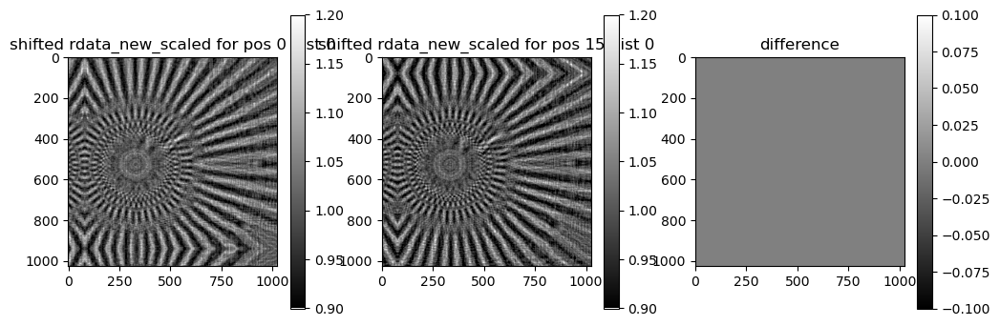

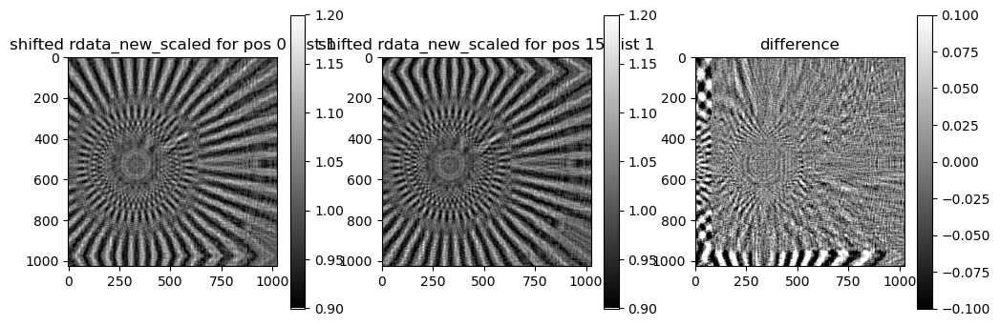

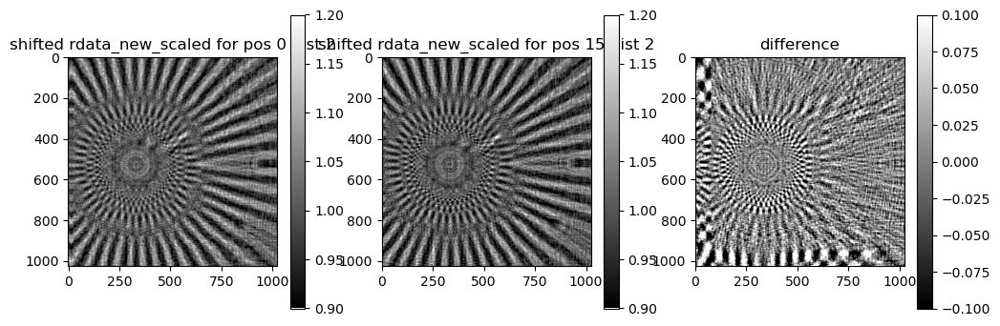

In [10]:
# shifts/=norm_magnifications[:,np.newaxis]
rdata_scaled = rdata.copy()
for j in range(npos):
    for k in range(ndist):    
        a = apply_shift(rdata[j,k:k+1],-shifts[j,k:k+1])[0]# note first shift then magnification
        a = ndimage.zoom(a,1/norm_magnifications[k])
        rdata_scaled[j,k] = a[a.shape[0]//2-n//2:a.shape[0]//2+n//2,a.shape[1]//2-n//2:a.shape[1]//2+n//2]        
        # a = rdata[j,k].copy()        
        # a = ndimage.zoom(a,1/norm_magnifications[k])
        # a = a[a.shape[0]//2-n//2:a.shape[0]//2+n//2,a.shape[1]//2-n//2:a.shape[1]//2+n//2]        
        # a = apply_shift(a[np.newaxis],-shifts[j,k:k+1])[0]# note first shift then magnification
        # rdata_scaled[j,k] = a
        # a = ndimage.zoom(a,1/norm_magnifications[k])
        # rdata_scaled[j,k] = a[a.shape[0]//2-n//2:a.shape[0]//2+n//2,a.shape[1]//2-n//2:a.shape[1]//2+n//2]        

for k in range(ndist):
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    im=axs[0].imshow(rdata_scaled[0,k],cmap='gray',vmin = 0.9,vmax=1.2 )
    axs[0].set_title(f'shifted rdata_new_scaled for pos 0 dist {k}')
    fig.colorbar(im)
    im=axs[1].imshow(rdata_scaled[-1,k],cmap='gray',vmin = 0.9,vmax=1.2 )
    axs[1].set_title(f'shifted rdata_new_scaled for pos {npos-1} dist {k}')
    fig.colorbar(im)        
    im=axs[2].imshow(rdata_scaled[0,k]-rdata_scaled[0,0],cmap='gray',vmin =-0.1,vmax=0.1 )
    axs[2].set_title(f'difference')
    fig.colorbar(im)        

In [11]:
data00 = data0-np.median(dark0,axis=0)
ref00 = ref0-np.median(dark0,axis=0)
data00[data00<0] = 0
ref00[ref00<0] = 0

data = data00[:,:,np.newaxis]# adding angular dim
ref = np.median(ref00,axis=0)

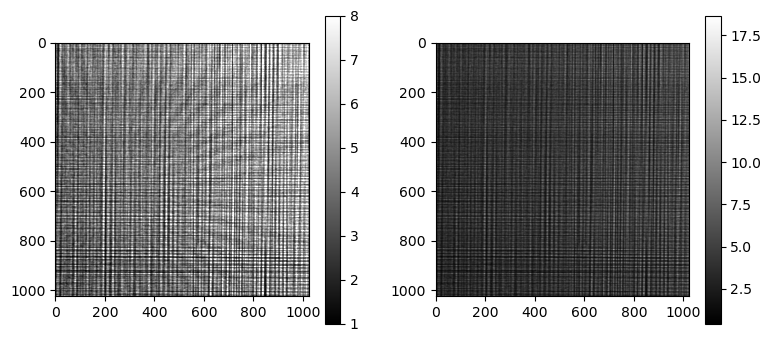

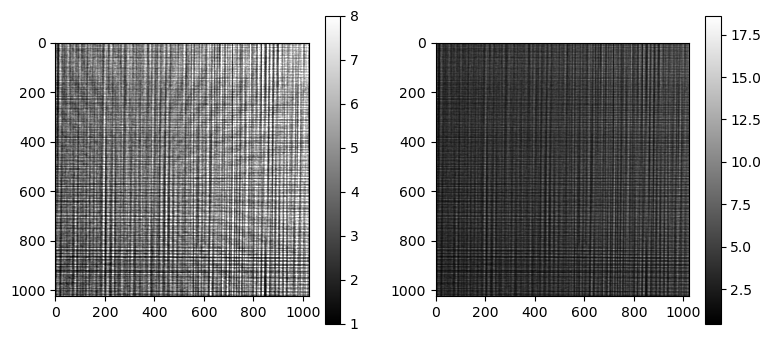

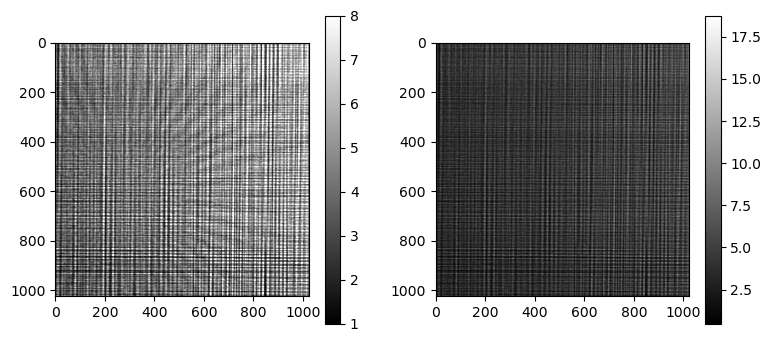

In [12]:
for k in range(ndist):
    fig, axs = plt.subplots(1, 2, figsize=(9, 4))
    im=axs[0].imshow(data[0,k,0],cmap='gray',vmax=8,vmin=1)
    fig.colorbar(im)
    im=axs[1].imshow(ref[k],cmap='gray')
    fig.colorbar(im)        
    

# Create solver class

In [13]:
pslv = holotomo.SolverHolo(1, n, 1, voxelsize, energy, distances[0:1], norm_magnifications[0:1]) 

## Goal: recover the sample and probe simultaneously $\ \sum_i\sum_j||\mathcal{G}_{d_j}((\mathcal{G}_{d'_j}q)(M_j S_{r_{ij}}\psi))|-\sqrt{\text{I}_{ij}}\|^2_2\to \text{min}_{\psi,q}$ 

$i$ - index for the NFP shifts\
$j$ - index for planes \
$\psi$ - sample at plane 0 \
$q$ - probe at plane 0\
$M_j$ - object normalized (de-)magnification for the plane $j$ \
$S_r$ - shift for distance r (x and y), NFP shifts + alignment shifts \
$\mathcal{G}_d$ - Fresnel transform for distance $d$

## Holotomography can be obtained by associating index $i$ with angles (no NFP)
## $\sum_i\sum_j||\mathcal{G}_{d_j}((\mathcal{G}_{d'_j}q)(M_j S_{r_{ij}}\psi_i))|-\sqrt{\text{I}_{ij}}\|^2_2\to \text{min}_{\psi_i,q} $

## Define forward operators as 
### $\psi \to \mathcal{G}_{d_j}((\mathcal{G}_{d'_j}q)(M_jS_{r_{ij}}\psi))$, where $i = 0 \dots 15$, $j = 0 \dots 3$ 
### $q \to \mathcal{G}_{d_j}((\mathcal{G}_{d'_j}q)(M_jS_{r_{ij}}\psi))$, where $i = 0 \dots 15$, $j = 0 \dots 3$, 
## The adjoint operators are then 
### $\sigma[\psi]\to \sum_j\sum_i M_j^*S_{-r_{ij}}((\mathcal{G}_{d'_j}q)^*\mathcal{G}_{-d_{j}}\sigma)$, 
### $\sigma[q]\to \sum_j\sum_i \mathcal{G}_{-d'_j}((M_jS_{r_{ij}}\psi)^*\mathcal{G}_{-d_j}\sigma)$

# Check double propagation

[0.00420013 0.00402658 0.0034558 ] [0.         0.00017355 0.00074433]
(16, 3, 1, 1024, 1024)


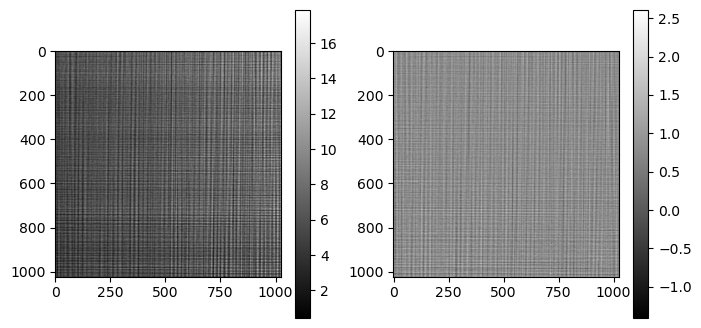

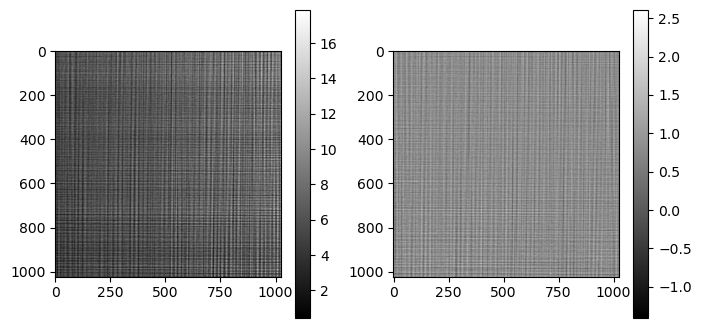

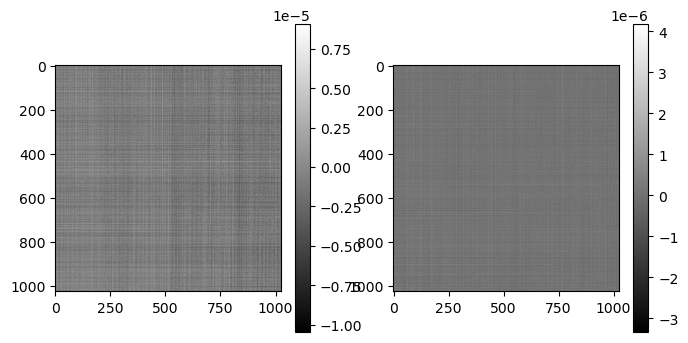

In [14]:
sx0 = 3.7e-4 # [m] motor offset from the focal spot
z1 = np.array([4.584e-3,4.765e-3,5.488e-3,6.9895e-3])-sx0 # positions of the sample
z1=z1[:ndist]
z2 = focusToDetectorDistance-z1 # propagation distance between the probe plane and detector
z1p = np.tile(np.array([4.584e-3]),ndist)-sx0 # positions of the sample
z2p = z1-z1p

magnifications = (z1+z2)/z1 # magnification when propagating from the probe plane to the sample
norm_magnifications = magnifications/magnifications[0] # normalized magnifications
distances = (z1*z2)/(z1+z2) # propagation distances after switching from the point source wave to plane wave,
distances = distances*norm_magnifications**2 # scaled propagation distances due to magnified probes
distances = distances

magnifications2 = (z1p+z2p)/z1p # magnification when propagating from the sample to the detector
distances2 = (z1p*z2p)/(z1p+z2p) # propagation distances after switching from the point source wave to plane wave,
norm_magnifications2 = magnifications2/magnifications2[0] # normalized magnifications
distances2 = distances2*norm_magnifications2**2 # scaled propagation distances due to magnified probes
distances2 = distances2*(z1p/z1)**2

print(distances,distances2)
pslv = holotomo.SolverHolo(1, n, 1, voxelsize, energy, distances, norm_magnifications, distances2) 

print(data.shape)
# arr1 = cp.pad(cp.array(data+1j*data).astype('complex64'),((1,1),(1,1),(1,1),(n//2,n//2),(n//2,n//2)),'symmetric')
# prb1 = cp.array(ref+1j*ref).astype('complex64')
arr1 = cp.pad(cp.array(data[0,0]+1j*data[0,0]).astype('complex64'),((0,0),(n//2,n//2),(n//2,n//2)),'symmetric')
prb1 = cp.array(ref[:1]+1j*ref[:1]).astype('complex64')


ddata1 = pslv.fwd_holo(arr1*0+1,prb1)

fig, axs = plt.subplots(1, 2, figsize=(8, 4))
im=axs[0].imshow(np.abs(ddata1[0,0].get()),cmap='gray')
fig.colorbar(im)
im=axs[1].imshow(np.angle(ddata1[0,0].get()),cmap='gray')#,vmin=1,vmax=2.5)
fig.colorbar(im)
fig, axs = plt.subplots(1, 2, figsize=(8, 4))
im=axs[0].imshow(np.abs(ddata1[-1,0].get()),cmap='gray')
fig.colorbar(im)
im=axs[1].imshow(np.angle(ddata1[-1,0].get()),cmap='gray')#,vmin=1,vmax=2.5)
fig.colorbar(im)
fig, axs = plt.subplots(1, 2, figsize=(8, 4))
im=axs[0].imshow(np.abs(ddata1[-1,0].get())-np.abs(ddata1[0,0].get()),cmap='gray')
fig.colorbar(im)
im=axs[1].imshow(np.angle(ddata1[-1,0].get())-np.angle(ddata1[0,0].get()),cmap='gray')
fig.colorbar(im)

# Adjoint test for holography with double propagation

In [15]:
arr1 = cp.pad(cp.array(data[0,0]+1j*data[0,0]).astype('complex64'),((0,0),(n//2,n//2),(n//2,n//2)),'symmetric')
prb1 = cp.array(ref[:1]+1j*ref[:1]).astype('complex64')
print(arr1.shape)
print(prb1.shape)
arr2 = pslv.fwd_holo(arr1,prb1)
arr3 = pslv.adj_holo(arr2,prb1)
prb3 = pslv.adj_holo_prb(arr2,arr1)


print(cp.sum(arr1*cp.conj(arr3)))
print(cp.sum(arr2*cp.conj(arr2)))
print(cp.sum(prb1*cp.conj(prb3)))

(1, 2048, 2048)
(1, 1024, 1024)
(8450893000-181.36823j)
(8450893000-0.00084861554j)
(8450892300-281.125j)


In [16]:
def fwd_nfp(pslv,psi,prb,shifts):
    fpsi = cp.zeros([shifts.shape[0],shifts.shape[1],1,n,n],dtype='complex64')
    for j in range(shifts.shape[0]):        
        fpsi[j] = pslv.fwd_holo(psi,prb,shifts[j])                      
    return fpsi

def adj_nfp(pslv,fpsi,prb,shifts):
    psi = cp.zeros([1,2*n,2*n],dtype='complex64')
    for j in range(shifts.shape[0]):        
        psi += pslv.adj_holo(fpsi[j],prb,shifts[j])                                   
    return psi

def adj_nfp_prb(pslv,fprb,psi,shifts):
    prb = cp.zeros([1,n,n],dtype='complex64')
    for j in range(shifts.shape[0]):        
        prb += pslv.adj_holo_prb(fprb[j],psi,shifts[j])           
    return prb

# Adjoint test

In [17]:
arr1 = cp.pad(cp.array(data[0,0]+1j*data[0,0]).astype('complex64'),((0,0),(n//2,n//2),(n//2,n//2)),'symmetric')
prb1 = cp.array(ref[:1]+1j*ref[:1]).astype('complex64')
arr2 = fwd_nfp(pslv,arr1,prb1,shifts)
arr3 = adj_nfp(pslv,arr2,prb1,shifts)
prb3 = adj_nfp_prb(pslv,arr2,arr1,shifts)

print(cp.sum(arr1*cp.conj(arr3)))
print(cp.sum(arr2*cp.conj(arr2)))
print(cp.sum(prb1*cp.conj(prb3)))

(110563050000-548.59973j)
(110563040000-0.13905087j)
(110563066000-210j)


## Gradient descent with the line search

In [26]:
def apply_shift(psi, p):
    """Apply shift for all projections."""
    psi = cp.array(psi)
    p = cp.array(p)
    tmp = cp.pad(psi,((0,0),(n//2,n//2),(n//2,n//2)), 'symmetric')
    [x, y] = cp.meshgrid(cp.fft.rfftfreq(2*n),
                         cp.fft.fftfreq(2*n))
    shift = cp.exp(-2*cp.pi*1j *
                   (x*p[:, 1, None, None]+y*p[:, 0, None, None]))
    res0 = cp.fft.irfft2(shift*cp.fft.rfft2(tmp))
    res = res0[:, n//2:3*n//2, n//2:3*n//2].get()
    return res
    
def line_search(minf, gamma, fu, fd):
    """ Line search for the step sizes gamma"""
    while(minf(fu)-minf(fu+gamma*fd) < 0 and gamma > 1e-12):
        gamma *= 0.5
    if(gamma <= 1e-12):  # direction not found
        #print('no direction')
        gamma = 0
    return gamma
    
def cg_holo(pslv, data, init, init_prb,  piter,shifts, upd_psi=True, upd_prb=False,step=1):
    """Conjugate gradients method for holography"""

    # minimization functional
    def minf(fpsi):
        f = cp.linalg.norm(cp.abs(fpsi)-cp.sqrt(data))**2            
        # f = cp.linalg.norm(cp.abs(fpsi)**2-data)**2            
        return f        
    psi = init.copy()
    prb = init_prb.copy()
    
    for i in range(piter):
        if upd_psi:
            
            fpsi = fwd_nfp(pslv,psi,prb,shifts)            
            grad = adj_nfp(pslv,
               fpsi-cp.sqrt(data)*cp.exp(1j*cp.angle(fpsi)), prb,shifts)/cp.max(cp.abs(prb))**2/ndist**2
                    
            d = -grad    
            # line search
            fd = fwd_nfp(pslv, d, prb,shifts)
            gammapsi = line_search(minf, 1, fpsi, fd)
            psi = psi+gammapsi*d
            
            if i%step==0:
                fig, axs = plt.subplots(2, 2, figsize=(15, 15))
                im=axs[0,0].imshow(np.abs(psi[0].get()),cmap='gray')
                axs[0,0].set_title('reconstructed amplitude')
                fig.colorbar(im)
                im=axs[0,1].imshow(np.angle(psi[0].get()),cmap='gray')
                axs[0,1].set_title('reconstructed phase')
                fig.colorbar(im)
                im=axs[1,0].imshow(np.angle(psi[0,n//2:-n//2,n//2:-n//2].get()),cmap='gray')
                axs[1,0].set_title('reconstructed phase')
                fig.colorbar(im)
                im=axs[1,1].imshow(np.angle(psi[0,n//2+n//4:-n//2-n//4,n//2+n//4:-n//2-n//4].get()),cmap='gray')
                axs[1,1].set_title('reconstructed phase')
                fig.colorbar(im)
                plt.show()
                fpsi = fwd_nfp(pslv,psi,prb,shifts)                            
                err=minf(fpsi)            
                print(f'{i}) {gammapsi=}, {err=:1.5e}')    
           
        if upd_prb:
            fprb = fwd_nfp(pslv,psi,prb,shifts)
            gradprb = adj_nfp_prb(pslv,fprb-cp.sqrt(data)*cp.exp(1j*cp.angle(fprb)),psi,shifts)/cp.max(cp.abs(psi))**2/pslv.ntheta/ndist**2

            dprb = -gradprb
            # gradprb0 = gradprb
            # line search
            fdprb = fwd_nfp(pslv,psi, dprb,shifts)
            gammaprb = line_search(minf, 1, fprb, fdprb)
            prb = prb + gammaprb*dprb
            
            if i%step==0:
                fprb = fwd_nfp(pslv,psi,prb,shifts)
                err=minf(fprb)
                print(f'{i}) {gammaprb=}, {err=:1.5e}')    
        
    return psi,prb

def cg_holo_batch(pslv, data, init, prb_init, piter,shifts=None,upd_psi=True,upd_prb=False,step=1):
    """Batch of CG solvers"""
    
    res = np.zeros([pslv.ntheta, 2*pslv.n, 2*pslv.n], dtype='complex64')
    prb_init_gpu = cp.array(prb_init)                
    for ids in holotomo.utils.chunk(range(pslv.ntheta), pslv.ptheta):
        # copy data part to gpu
        data_gpu = cp.array(data[:,:,ids])
        init_gpu = cp.array(init[ids])
        
        # Radon transform
        res_gpu,res_prb_gpu = cg_holo(pslv, data_gpu, init_gpu,prb_init_gpu, piter,shifts,upd_psi, upd_prb,step)
        # copy result to cpu
        res[ids] = res_gpu.get()
        res_prb = res_prb_gpu.get()
    return res,res_prb



# Estimate probe using one reference image $\||\mathcal{G}_{d_0}q|-\sqrt{\text{I}_{r_0}}\|^2_2\to \text{min}$, taken for distance 0


(1, 1, 1, 1024, 1024)
0) gammaprb=1, err=1.07703e+06
8) gammaprb=1, err=1.63601e+05
16) gammaprb=1, err=2.48512e+04
24) gammaprb=1, err=3.77494e+03
32) gammaprb=1, err=5.73414e+02
40) gammaprb=1, err=8.70990e+01
48) gammaprb=1, err=1.32304e+01
56) gammaprb=1, err=2.00971e+00
64) gammaprb=1, err=3.04920e-01
72) gammaprb=1, err=4.63064e-02
80) gammaprb=1, err=7.10494e-03
88) gammaprb=1, err=1.04578e-03
96) gammaprb=1, err=1.60876e-04
104) gammaprb=1, err=2.35539e-05
112) gammaprb=1, err=3.95702e-06
120) gammaprb=1, err=9.96744e-07
128) gammaprb=1, err=5.81107e-07
136) gammaprb=1, err=2.29943e-07
144) gammaprb=1, err=3.39584e-07
152) gammaprb=1, err=3.64374e-07
160) gammaprb=1, err=2.44259e-07
168) gammaprb=1, err=2.46427e-07
176) gammaprb=1, err=2.38911e-07
184) gammaprb=1, err=2.40685e-07
192) gammaprb=1, err=3.34961e-07
200) gammaprb=1, err=2.39471e-07
208) gammaprb=1, err=2.05014e-07
216) gammaprb=1, err=2.53243e-07
224) gammaprb=1, err=3.59745e-07
232) gammaprb=1, err=2.04033e-07
240

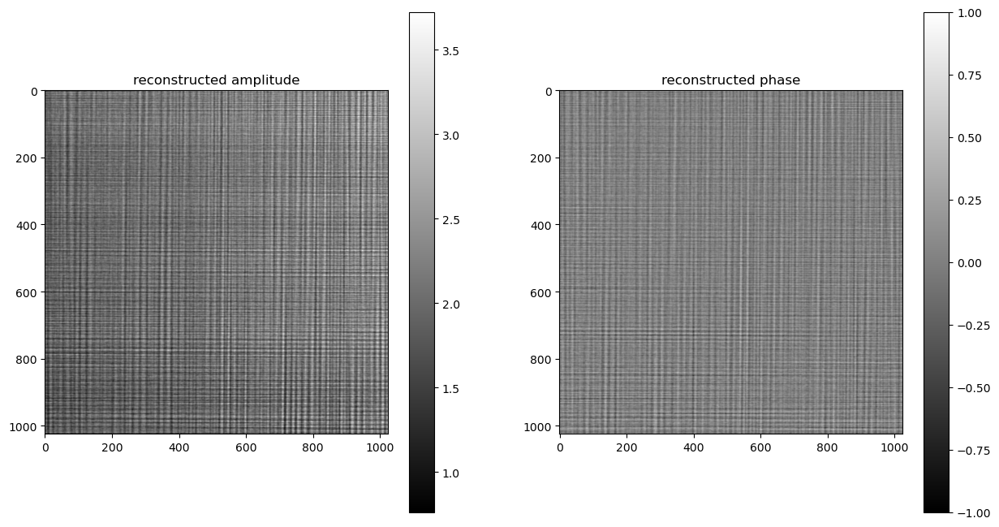

In [29]:
rec = np.ones([1,2*n,2*n],dtype='complex64')
rec_prb = np.ones([1,n,n],dtype='complex64')        
data_ref = ref[:1,np.newaxis,np.newaxis]
print(data_ref.shape)
shifts_ref = (shifts/cp.array(norm_magnifications[:,np.newaxis]))[:1,:1]*0
pslv = holotomo.SolverHolo(1, n, 1, voxelsize, energy, distances[:1], norm_magnifications[:1], distances2[:1]) 
_,rec_prb = cg_holo_batch(pslv, data_ref, rec, rec_prb, 512, shifts_ref, False,True,8)

fig, axs = plt.subplots(1, 2, figsize=(15, 8))
im=axs[0].imshow(np.abs(rec_prb[0]),cmap='gray')
axs[0].set_title('reconstructed amplitude')
fig.colorbar(im)
im=axs[1].imshow(np.angle(rec_prb[0]),cmap='gray',vmin=-1,vmax=1)
axs[1].set_title('reconstructed phase')
fig.colorbar(im)


## $\ \sum_j\sum_i||\mathcal{G}_{d_j}((\mathcal{G}_{d'_j}q)(M_j S_{r_{ij}}\psi))|-\sqrt{\text{I}_{ij}}\|^2_2\to \text{min}_{\psi,q}$ 

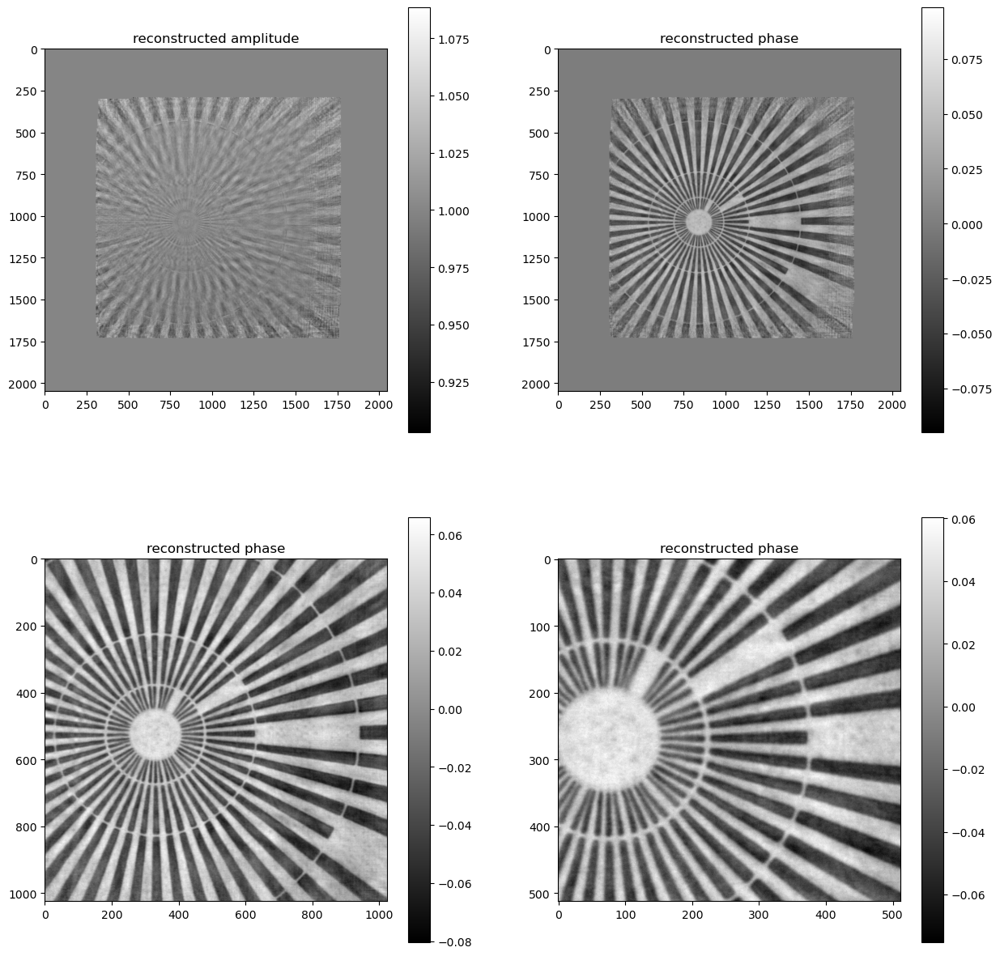

0) gammapsi=1, err=3.85250e+04
0) gammaprb=0.5, err=3.85194e+04


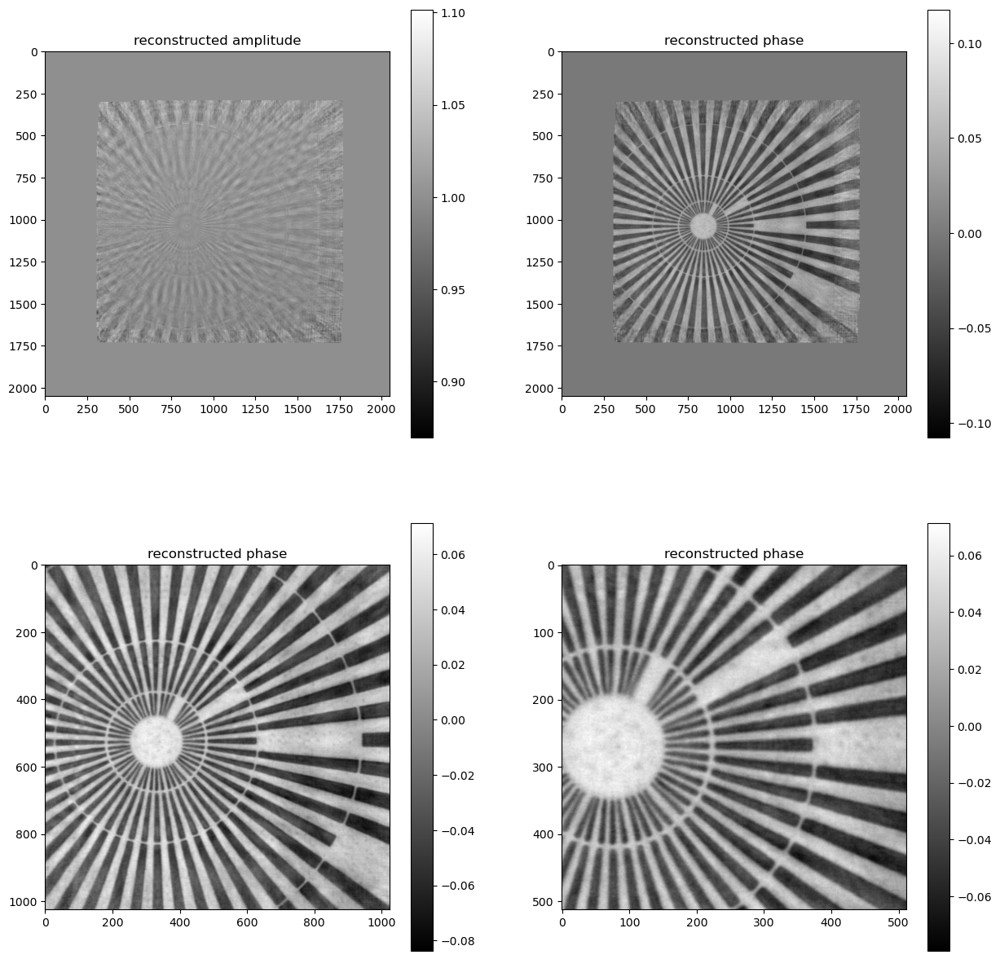

128) gammapsi=1, err=3.52686e+04
128) gammaprb=0.5, err=3.52624e+04


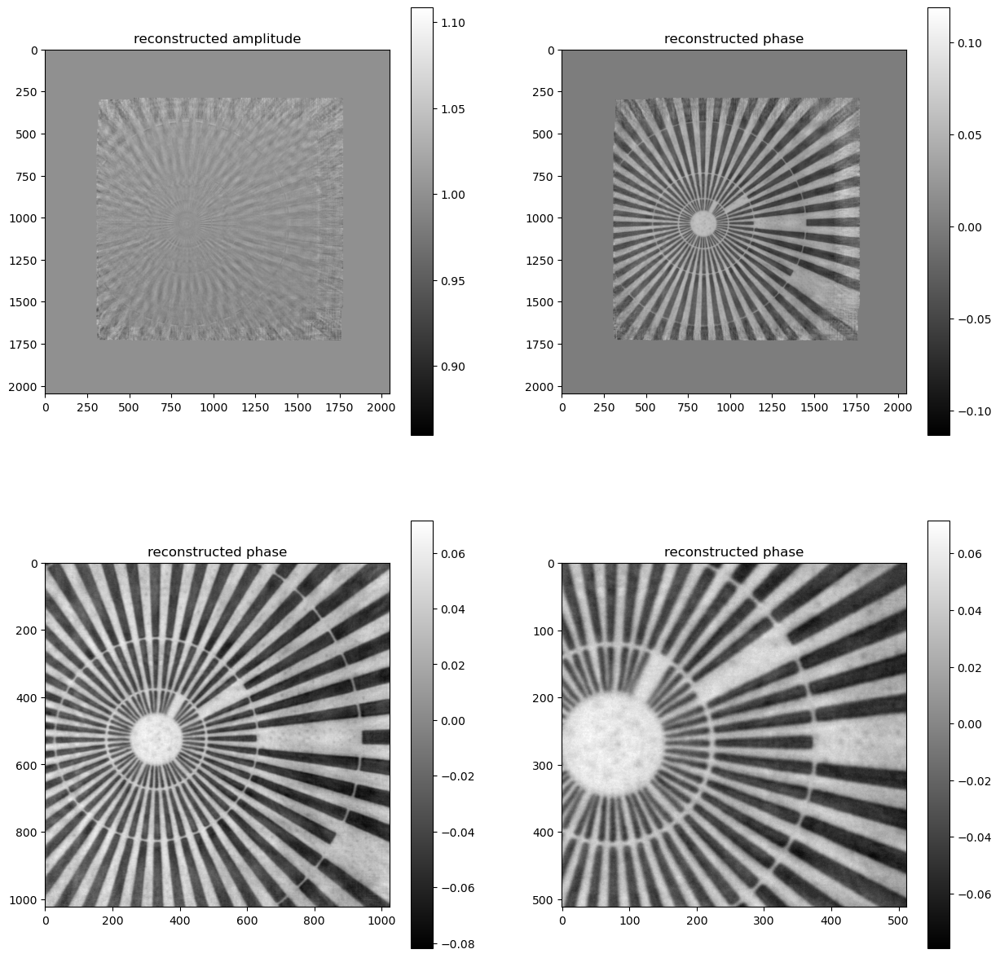

256) gammapsi=1, err=3.33232e+04
256) gammaprb=0.5, err=3.33151e+04


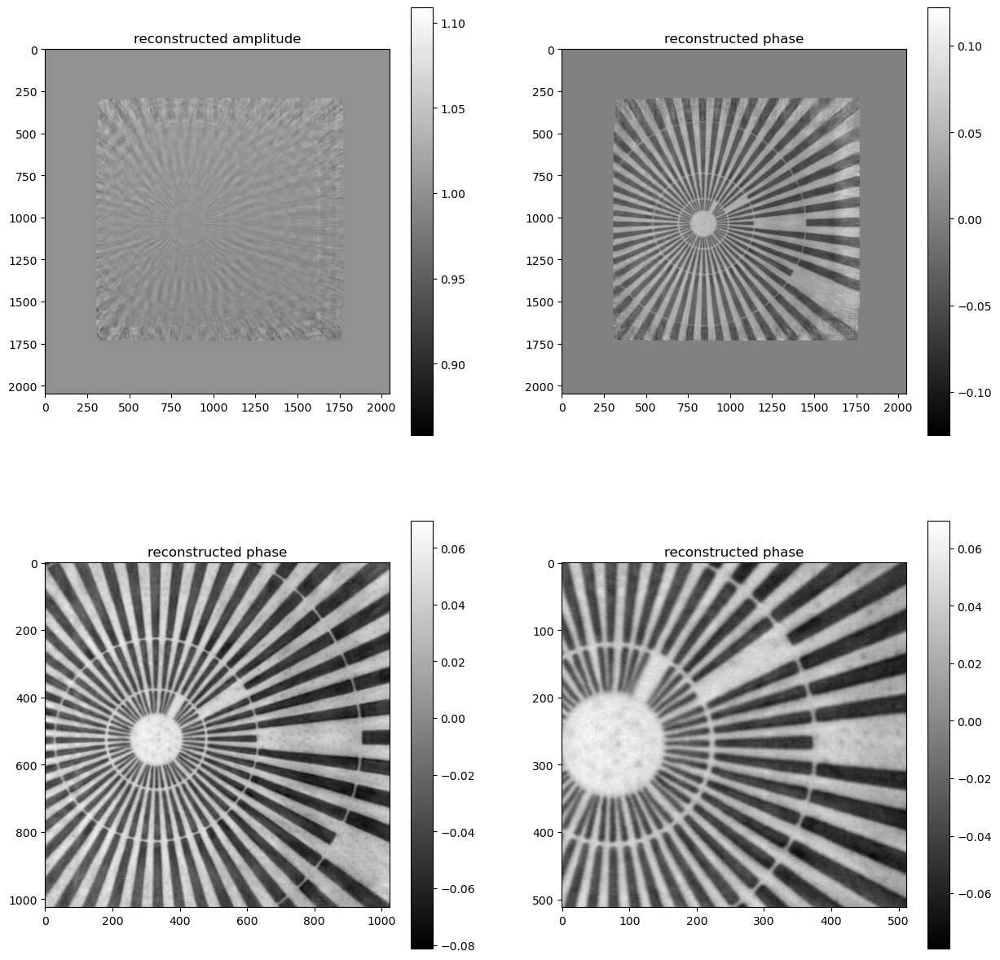

384) gammapsi=1, err=3.20372e+04
384) gammaprb=0.5, err=3.20315e+04


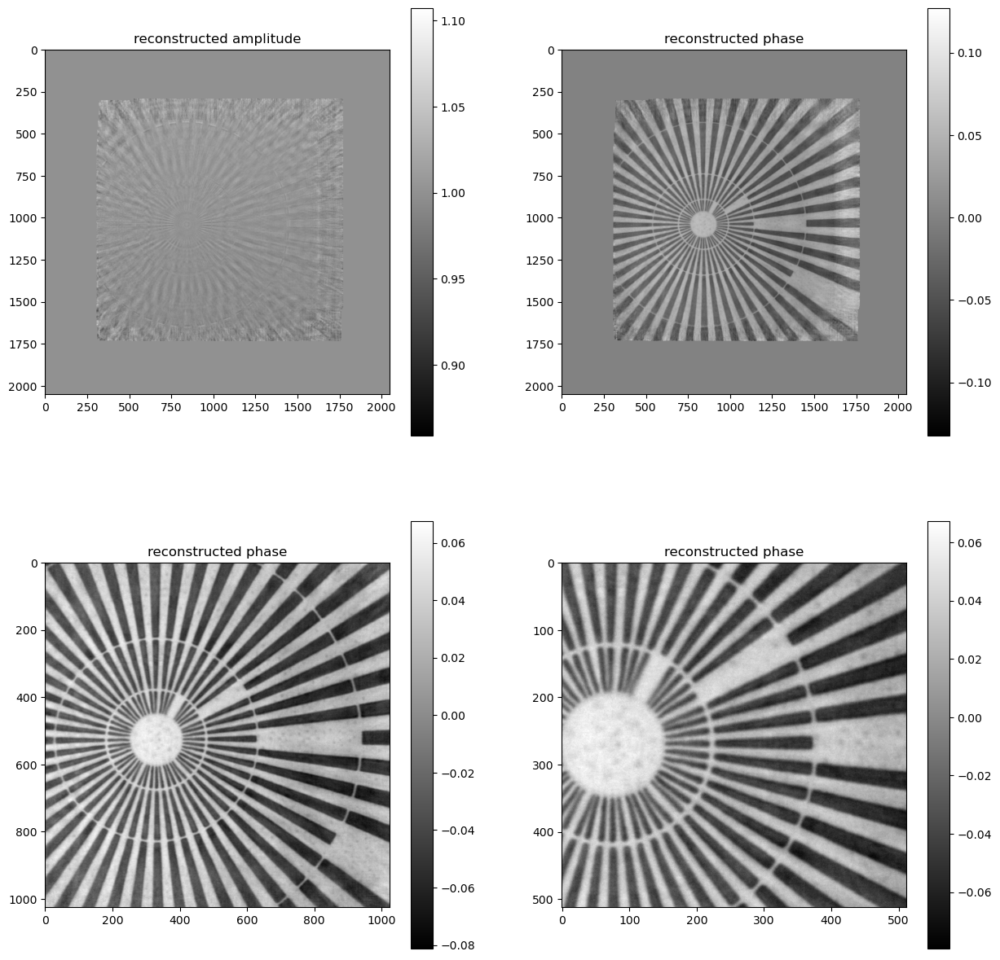

512) gammapsi=1, err=3.11095e+04
512) gammaprb=0.5, err=3.11083e+04


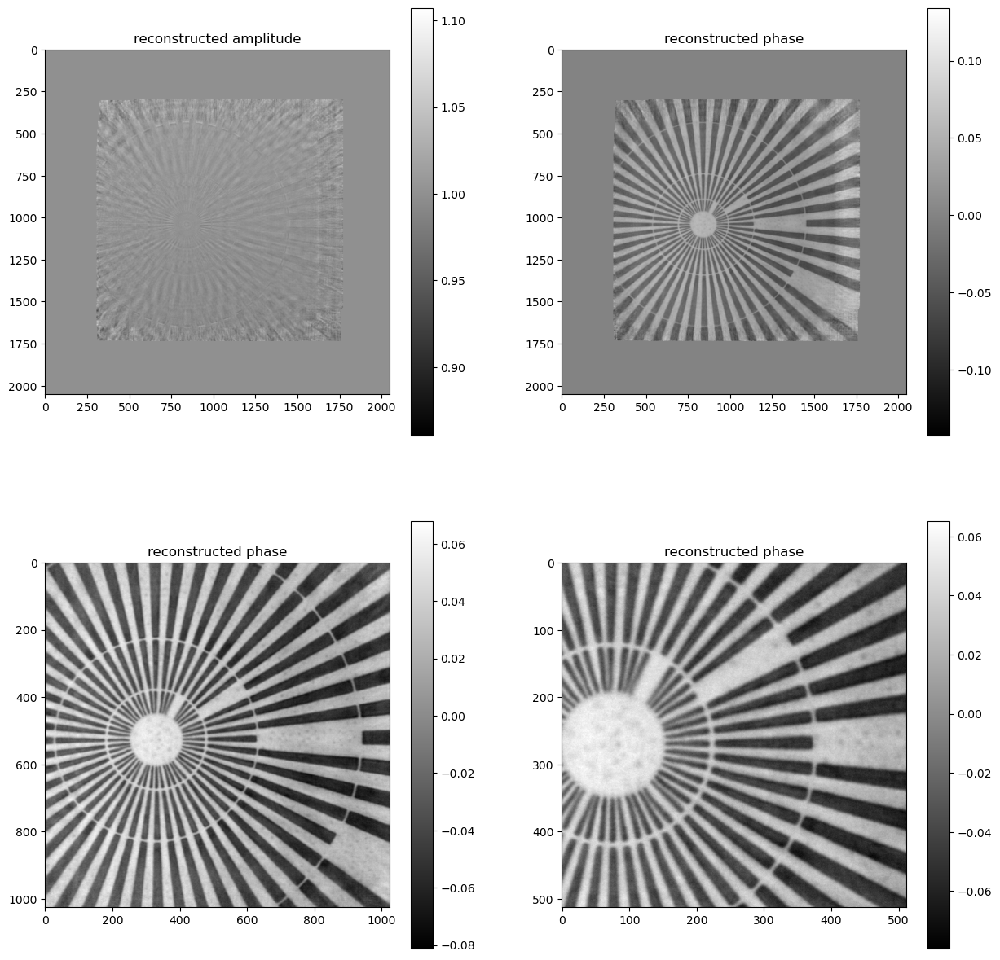

640) gammapsi=1, err=3.03963e+04
640) gammaprb=0.5, err=3.03956e+04


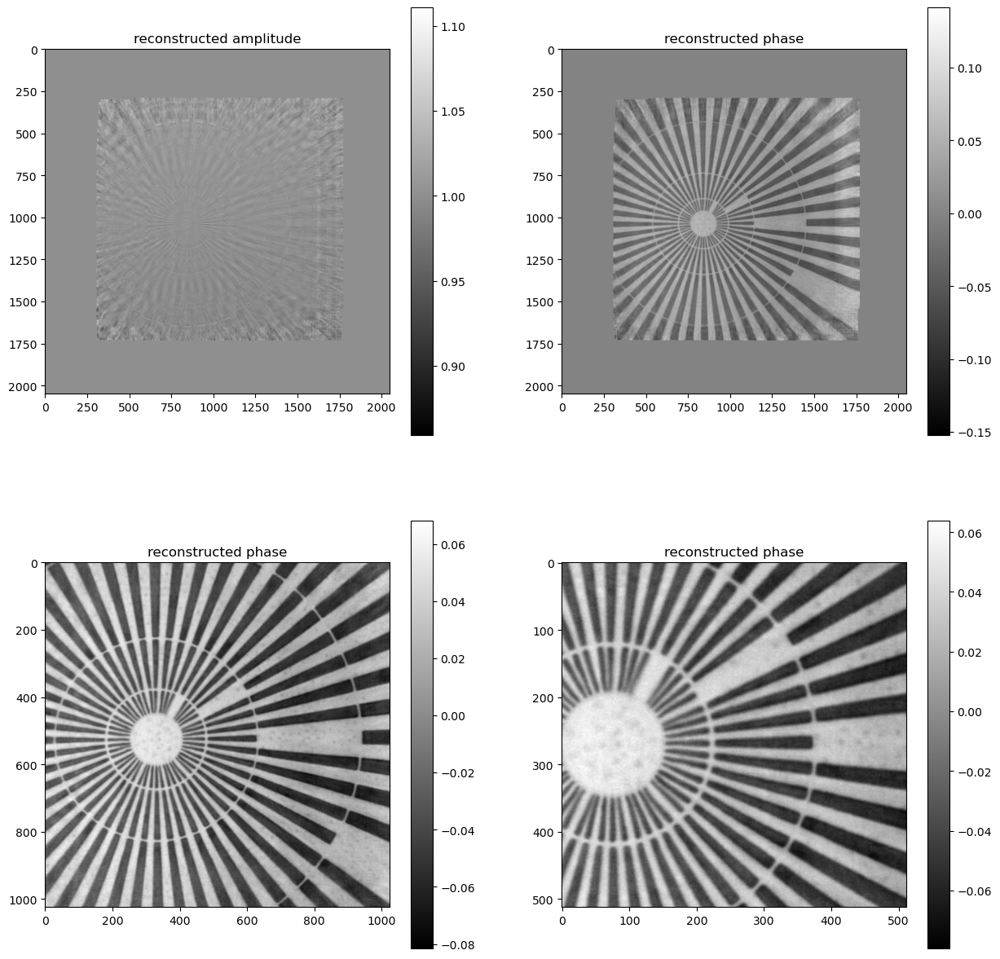

768) gammapsi=1, err=2.98326e+04
768) gammaprb=0.5, err=2.98295e+04


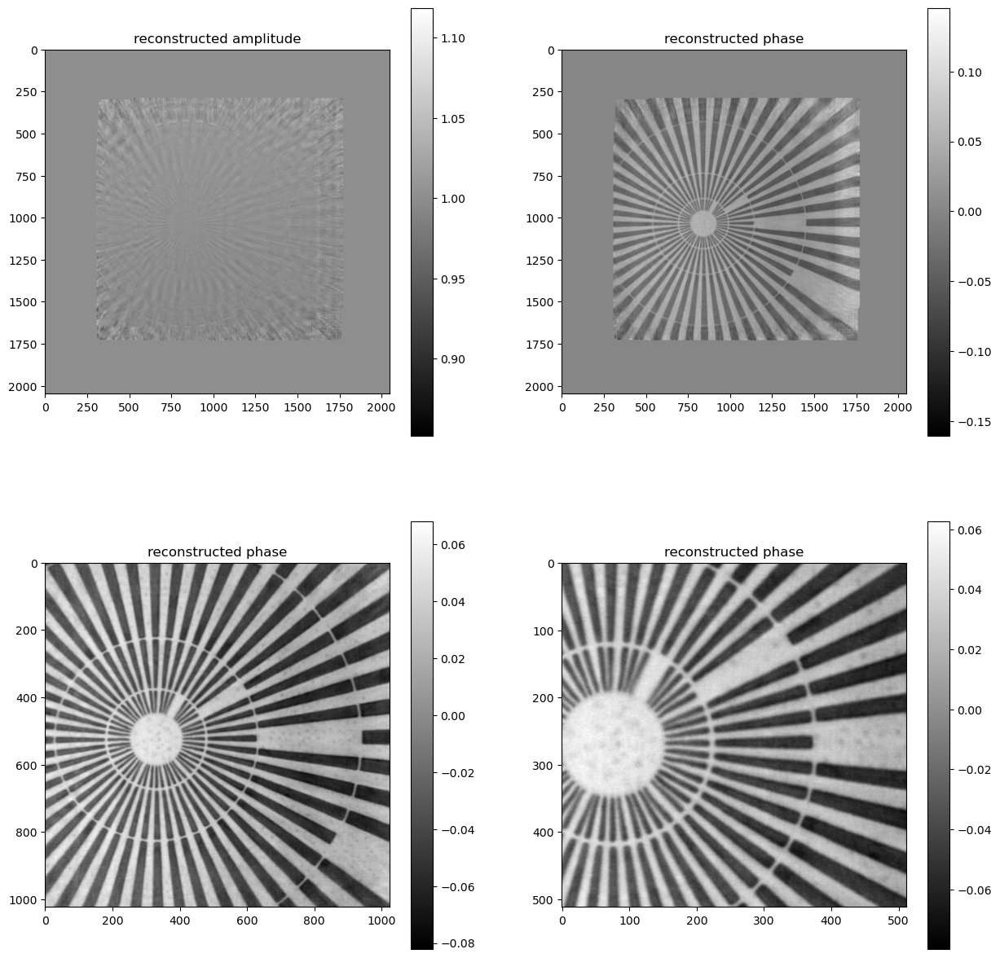

896) gammapsi=1, err=2.93983e+04
896) gammaprb=0.5, err=2.93966e+04


: 

In [34]:

pslv = holotomo.SolverHolo(1, n, 1, voxelsize, energy, distances, norm_magnifications, distances2) 
rec,rec_prb = cg_holo_batch(pslv, data, rec, rec_prb, 1024, shifts/cp.array(norm_magnifications[:,np.newaxis]), True,True,128)

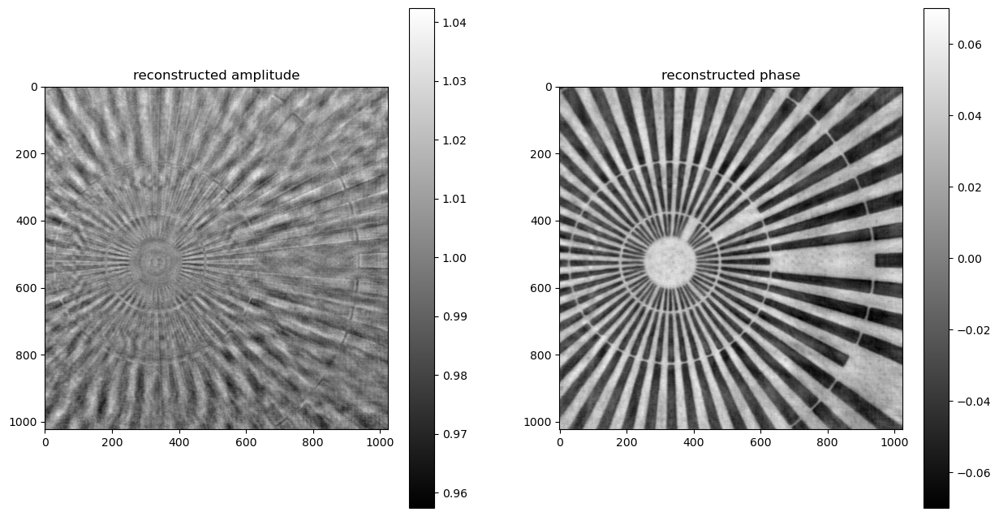

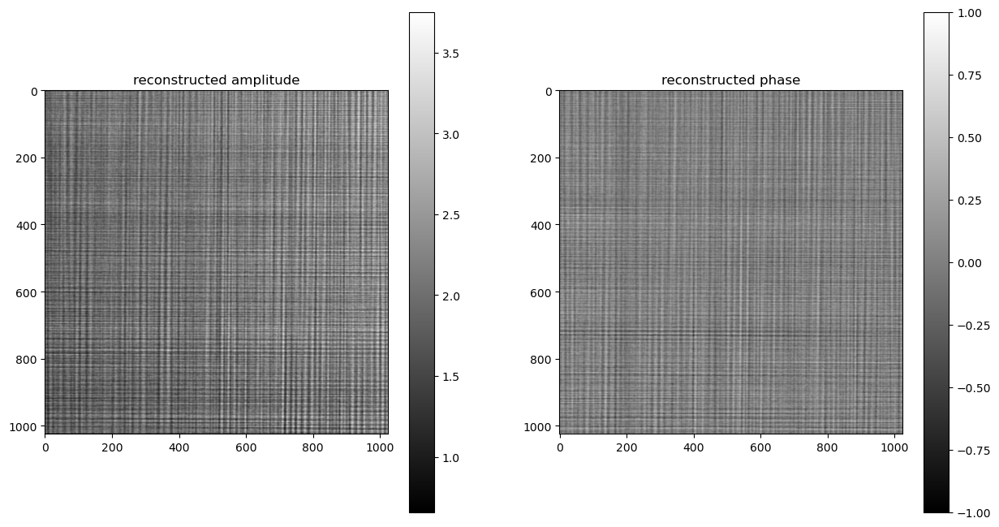

In [33]:

fig, axs = plt.subplots(1, 2, figsize=(15, 8))
im=axs[0].imshow(np.abs(rec[0,n//2:-n//2,n//2:-n//2]),cmap='gray')
axs[0].set_title('reconstructed amplitude')
fig.colorbar(im)
im=axs[1].imshow(np.angle(rec[0,n//2:-n//2,n//2:-n//2]),cmap='gray',vmin=-0.07,vmax=0.07)
axs[1].set_title('reconstructed phase')
fig.colorbar(im)
fig, axs = plt.subplots(1, 2, figsize=(15, 8))
im=axs[0].imshow(np.abs(rec_prb[0]),cmap='gray')
axs[0].set_title('reconstructed amplitude')
fig.colorbar(im)
im=axs[1].imshow(np.angle(rec_prb[0]),cmap='gray',vmin=-1,vmax=1)
axs[1].set_title('reconstructed phase')
fig.colorbar(im)